# Problem statement

Find the path and end position for a drone. 
Input: the map in txt and png format, noisy odometries and noisy lidar's measurements./

The full task is here:https://gist.github.com/theikkila/dbc7d15b320577bcfee6b1135415a3bc

My goal is to solve the problem using Monte Carlo localization algorythm.

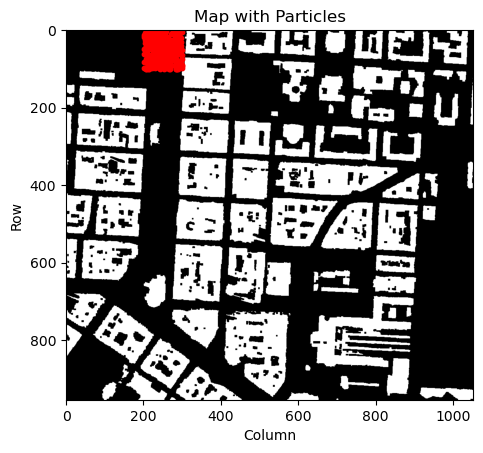

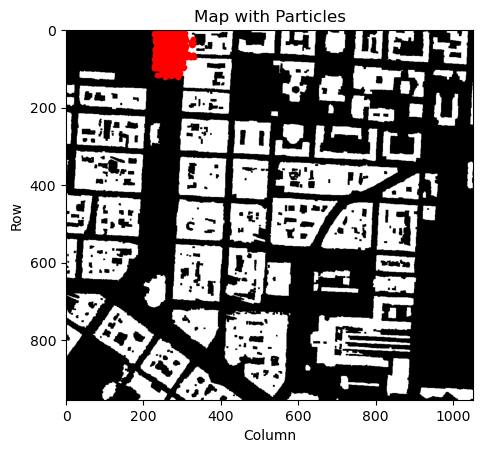

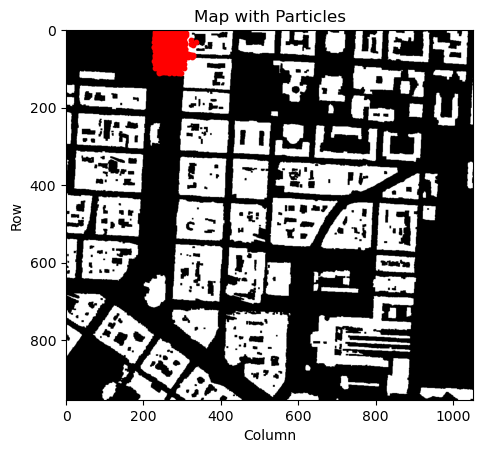

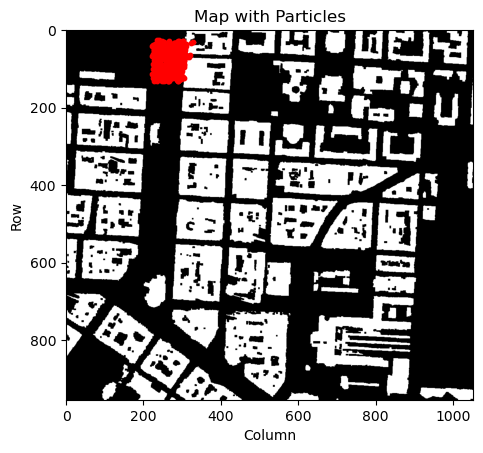

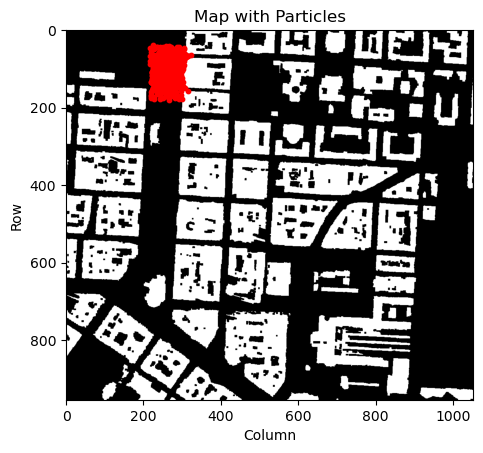

...

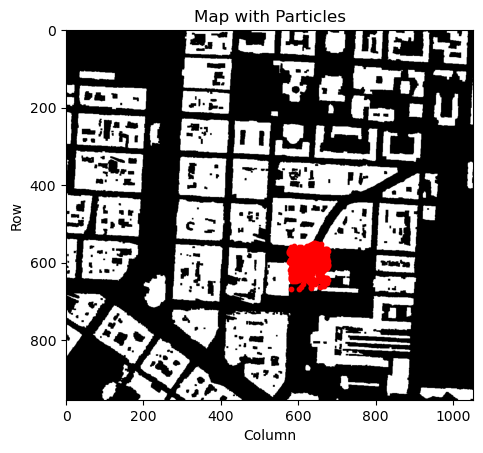

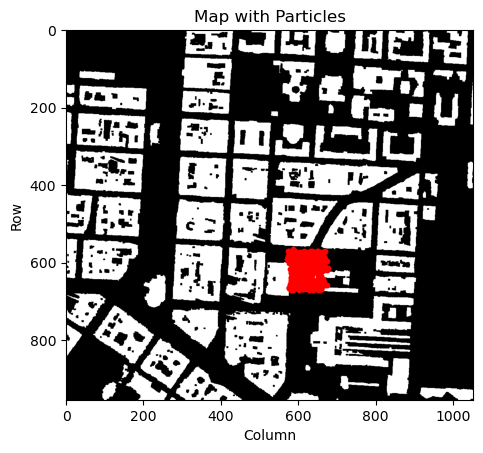

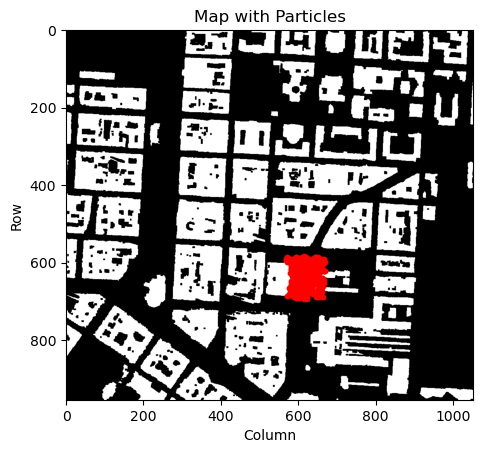

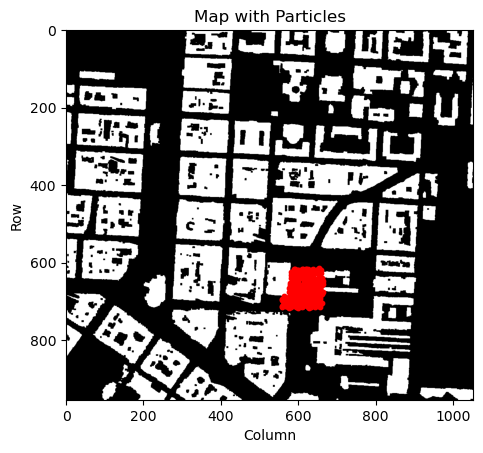

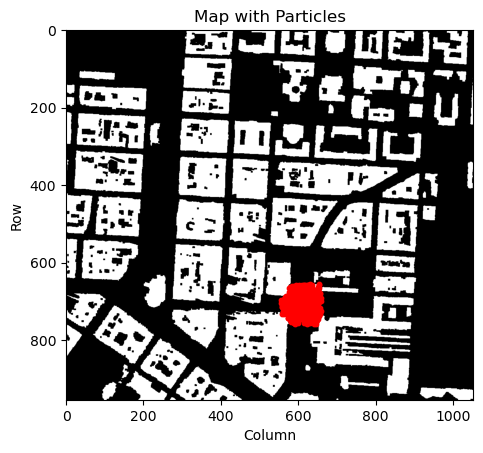

In [1]:
import numpy as np
import json
from math import sqrt
import random
import matplotlib.pyplot as plt
import cv2

# Load map data from TXT file
map_txt_file = 'map_stadi.txt'
with open(map_txt_file, 'r') as file:
    map_lines = file.readlines()

map_data = [[int(value) for value in line.strip()] for line in map_lines]
omap = np.array(map_data)
omap = np.flipud(omap)

# Load sensor data
with open('drone_log.jsonl', 'r') as file:
    sensor_data = [json.loads(line) for line in file]

# Define constants
NUM_PARTICLES = 300
NOISE_VARIANCE_ODOMETRY = 4.4
NOISE_VARIANCE_LIDAR = 0.1
ANGULAR_RESOLUTION = 10  # in degrees

# Define helper functions
def measure_distance(omap, x0, y0, vx, vy, max_steps=200):
    y = y0
    x = x0
    he, wi = omap.shape
    for step in range(max_steps):
        y += vy
        x += vx
        if x >= wi or x < 0 or y >= he  or y < 0:  
            return -1
        if omap[int(y), int(x)] > 0:
            return sqrt((x0 - x)**2 + (y0 - y)**2)
    return -1

def create_particles(start_x, end_x, start_y, end_y, NUM_PARTICLES):
    column_rand_values = []
    row_rand_values = []
    particles = []
    n = 0
    while n < NUM_PARTICLES:
        rand_x = random.randint(start_x, end_x)
        rand_y = random.randint(start_y, end_y)
        if 0 <= rand_x < omap.shape[1] and  0 <= rand_y < omap.shape[0] and omap[rand_y, rand_x] == 0:
            column_rand_values.append(rand_x)
            row_rand_values.append(rand_y)
            n += 1
    for particle in range(NUM_PARTICLES):
        particles.append((column_rand_values[particle], row_rand_values[particle]))
    return particles

def observation_model(x, y):
    lidar_distances = []
    for angle in range(0, 360, ANGULAR_RESOLUTION):
        rad = np.deg2rad(angle)
        vx = np.cos(rad)
        vy = np.sin(rad)
        lidar_distances.append(measure_distance(omap, x, y, vx, vy))
        lidar_mes_0 = [lidar_distances[0]]
        lidar_rest = lidar_distances[1:]
        lidar_rest = lidar_rest[::-1]
        lidar_measurements = lidar_mes_0 + lidar_rest
    return lidar_measurements

# Initialize particle weights
weights = np.ones(NUM_PARTICLES) / NUM_PARTICLES

# Initialize particles
particles = create_particles(200, 300, 0, 100, NUM_PARTICLES)  

def mean_particle_coordinates(particles):
    x_coords = [particle[0] for particle in particles]
    y_coords = [particle[1] for particle in particles]
    mean_x = np.mean(x_coords)
    mean_y = np.mean(y_coords)
    return mean_x, mean_y
    
#Create lists for drone's coordinates
x_coord = []
y_coord = []

def plot_map_and_particles(omap, particles):
    plt.imshow(omap, cmap='gray')
    plt.scatter([particle[0] for particle in particles], [particle[1] for particle in particles], color='red', s=10)
    plt.title('Map with Particles')
    plt.xlabel('Column')
    plt.ylabel('Row')
    plt.show()
 
st_dev_odometry = 2 * sqrt(NOISE_VARIANCE_ODOMETRY)  

# Iterate over sensor data
for frame in sensor_data[1:]:
    odometry_x = frame['odometry_x']
    odometry_y = frame['odometry_y']
    odometry_y = -1 * odometry_y
    lidar_data = frame['lidar']
    plot_map_and_particles(omap, particles)

    # Move particles 
    moved_particles = []
    for x, y in particles:
        x_current = x + odometry_x
        y_current = y + odometry_y 
        if 0 <= y_current < omap.shape[0] and 0 <= x_current < omap.shape[1] and omap[int(y_current), int(x_current)] == 0:
            moved_particles.append((x_current, y_current))
    particles = moved_particles
    cur_NUM_PARTICLES = len(particles)
    weights = np.ones(cur_NUM_PARTICLES) / cur_NUM_PARTICLES
   
    # Update particle weights based on observation
    for i in range(cur_NUM_PARTICLES):
        x, y = particles[i]
        particle_lidar_data = observation_model(x, y)
        error = np.sum((np.array(lidar_data) - np.array(particle_lidar_data))**2)
        weights[i] = 1.0 / (error + 1e-10)  # Adding a small value to avoid division by zero
    weights_sorted = np.argsort(-weights)
        
    #Resample particles
    top_indices = weights_sorted[:6]
    top_particles = [particles[i] for i in top_indices]
            
    x_coord.append(top_particles[0][0])
    y_coord.append(top_particles[0][1])
    
    particles = top_particles
    cur_NUM_PARTICLES = len(particles)
   
    #Create new particles around best
    around_top_particles = []    
    for n in range(cur_NUM_PARTICLES):
        around_top_particles.extend(create_particles(int(particles[n][0] - 50), int(particles[n][0] + 50), int(particles[n][1] - 50), int(particles[n][1] + 50), 80))
    from collections import Counter
    tuple_counts = Counter(around_top_particles)
    particles = [t for t in around_top_particles if tuple_counts[t] == 1]

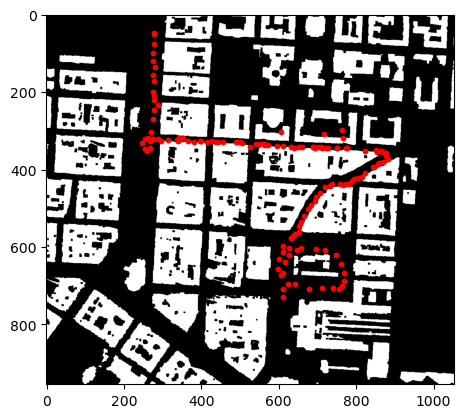

In [2]:
plt.imshow(omap, cmap='gray')
plt.scatter(x_coord, y_coord, color='red', s=10)
plt.show()